In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
import glob

In [5]:
def Fits_Array(a):
    """Función para generar un array tridimensional de imágenes, siendo 'a'
    una lista con los pathnames de las imágenes que se quiere estackear"""
    b=np.empty([4096,4096,0])
    for i in range(len(a)):
        x=fits.open(a[i])
        b=np.dstack((b,np.array(x[0].data)))
    return b

In [77]:
#Se genera la lista de pathnames con glob.glob y se les aplica la función para estackear
b=glob.glob('Images/Test/Bias_1x1_*.fit')
bias=Fits_Array(b)

In [78]:
f=glob.glob('Images/Test/FLAT_V_B11-*')
flats=Fits_Array(f)

In [84]:
d=glob.glob('Images/Test/DARK_400sec_B11-*')
darks=Fits_Array(d)

In [80]:
l=glob.glob('Images/Test/Light_NGC_1316_V_400.000secs_*')
lights=Fits_Array(l)

In [150]:
def Plots(cube,rows,columns,min_value,max_value,size_x=30,size_y=30):
    """Función para plotear la imágenes de un cubo, se pueden ajustar tanto el tamaño de las filas y columnas como el tamaño de
    la figura completa, hay que dar valores para los topes del cmap (por default es gray)"""
    fig=plt.figure(figsize=(size_x,size_y))
    for i in range (cube.shape[2]):
        fig.add_subplot(rows,columns,i+1).imshow(cube[:,:,i],vmin=min_value,vmax=max_value,cmap='gray')

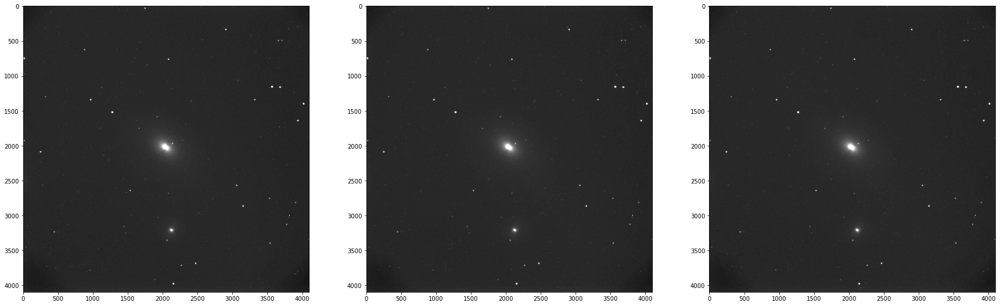

In [151]:
Plots(lights,1,3,0,1000)

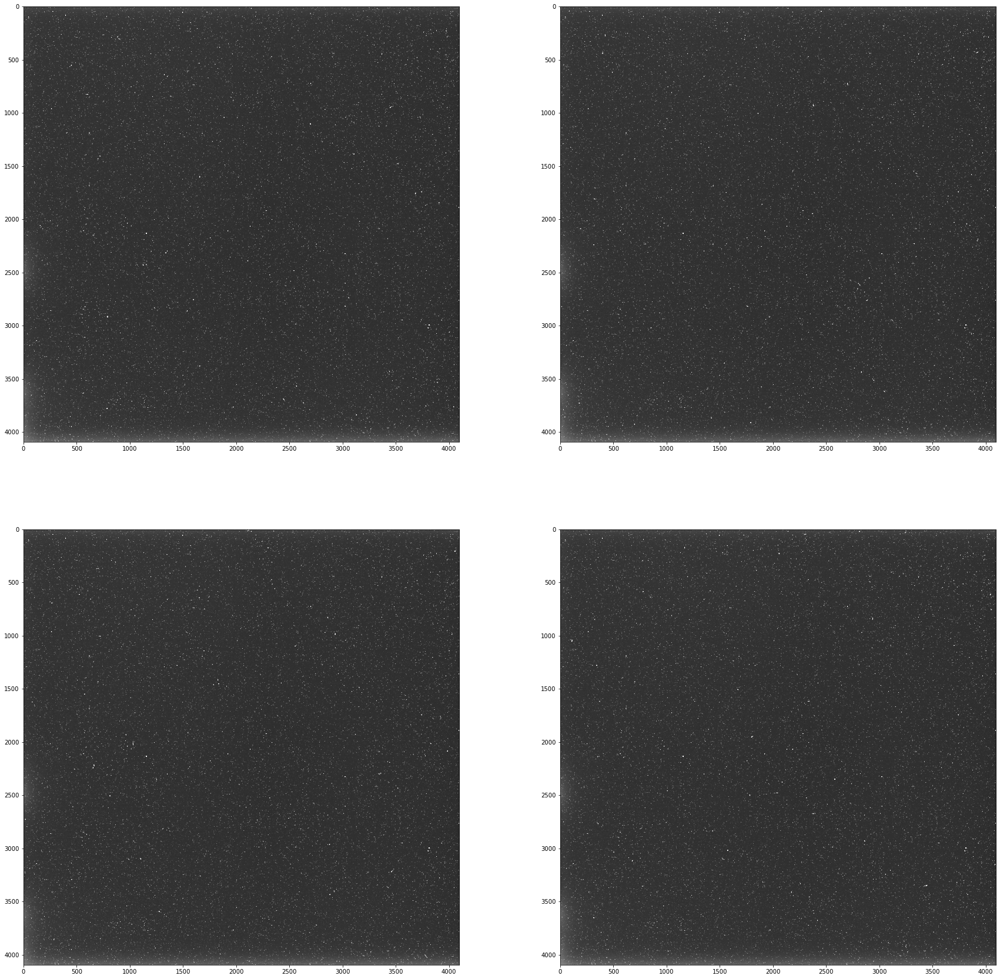

In [206]:
Plots(darks,2,2,50,250)

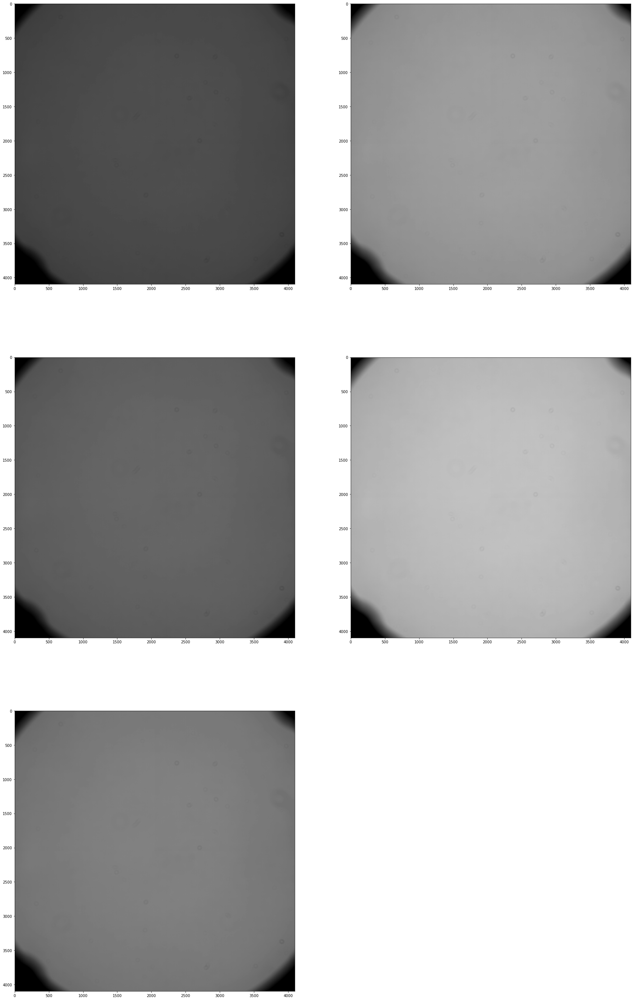

In [189]:
Plots(flats,3,2,10000,50000,size_y=50)

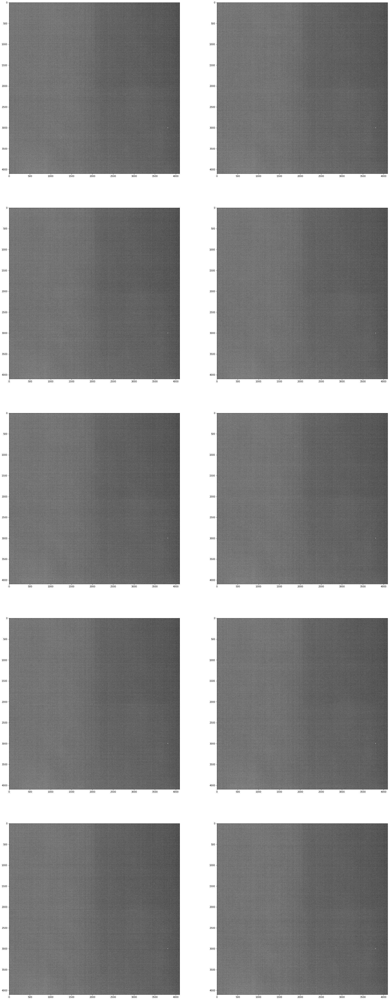

In [177]:
Plots(bias,5,2,80,110,size_y=80)

In [216]:
#Reducción
Master_Bias=np.mean(bias,axis=2)
Master_Dark=np.mean(darks,axis=2)
Dark_Bias=(Master_Bias+Master_Dark)/2
Master_Flat=np.mean(flats,axis=2)
Norm_Master_Flat=(Master_Flat-Dark_Bias)/(np.median(Master_Flat-Dark_Bias))
Master_Light=np.mean(lights,axis=2)

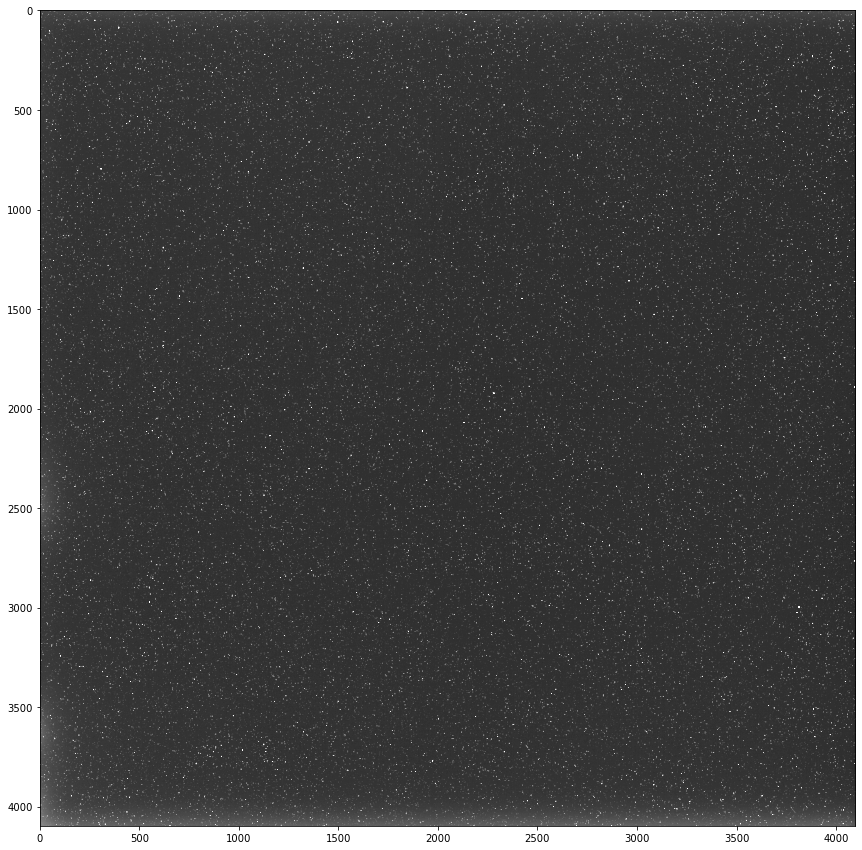

In [215]:
plt.figure(figsize=(15,15))
plt.imshow(Master_Dark,vmin=50,vmax=250,cmap='gray')

In [217]:
reduc=(Master_Light-Master_Dark)/Norm_Master_Flat

/tmp/ipykernel_4963/3774457080.py:1: RuntimeWarning: invalid value encountered in true_divide
  reduc=(Master_Light-Master_Dark)/Norm_Master_Flat


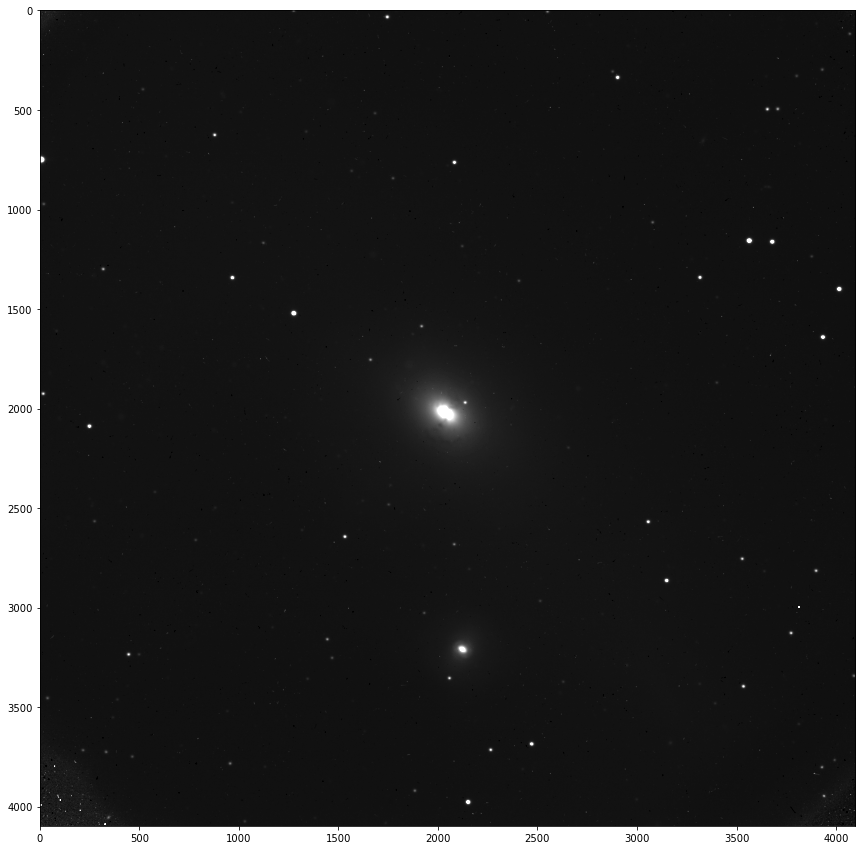

In [222]:
plt.figure(figsize=(15,15))
plt.imshow(reduc,vmin=0,vmax=900,cmap='gray')